<a href="https://colab.research.google.com/github/code-runner1306/Dog_Vision/blob/main/Dog_Vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# !unzip "/content/drive/MyDrive/Dog_Vision_Dataset/dog-breed-identification.zip" -d "/content/drive/MyDrive/Dog_Vision_Dataset"

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [1]:
## THIS IS A COLAB NOTEBOOK

In [2]:
!pip install tf-keras==2.15.1
import tensorflow as tf   # used to create workflow pipeline and convert images to tensors.
import tensorflow_hub as hub  # used to pick a model and use it
print("TensorFlow version: ", tf.__version__)
print("TensorFlow Hub version: ", tf.__version__)
print("GPU", "Available(YES!!!!!)" if tf.config.list_physical_devices("GPU") else "Not Available")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 20.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.2/475.2 MB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 29.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 46.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 39.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 442.0/442.0 kB 17.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 4.1 MB/s eta 0:00:00
  Attempting uninstall: wrapt
    Found existing installation: wrapt 1.17.0
    Uninstalling wrapt-1.17.0:
      Successfully uninstalled wrapt-1.17.0
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.4.1
    Uninstalling ml-dtypes-0.4.1:
      Successfully uninstalled ml-dtypes-0.4.1
  Attempting uninstall: keras
    Found existing installation: keras 3.5.0
    Uninstalling keras-3.5.0:
      Successfully uninstalled ke

In [14]:
labels = pd.read_csv("/content/drive/MyDrive/Dog_Vision_Dataset/labels.csv")
labels.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [15]:
labels.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10222 entries, 0 to 10221
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      10222 non-null  object
 1   breed   10222 non-null  object
dtypes: object(2)
memory usage: 159.8+ KB


In [16]:
labels['breed'].value_counts()

,count
breed,
scottish_deerhound,126
maltese_dog,117
afghan_hound,116
entlebucher,115
bernese_mountain_dog,114
...,...
golden_retriever,67
komondor,67
brabancon_griffon,67


<Axes: xlabel='breed'>

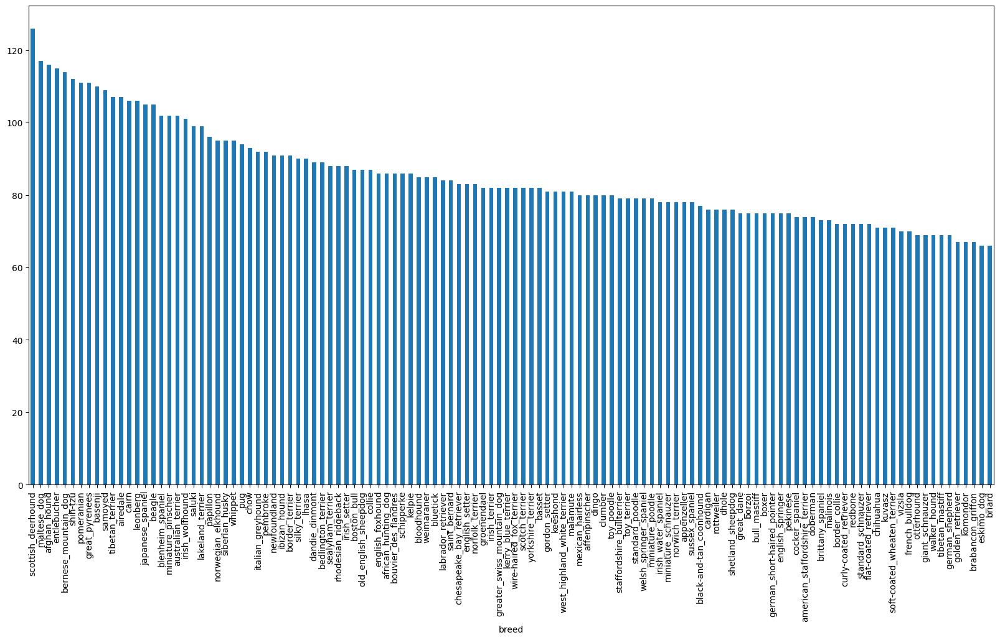

In [17]:
labels['breed'].value_counts().plot(kind='bar', figsize=(20,10))

In [18]:
labels['breed'].value_counts().median()

82.0

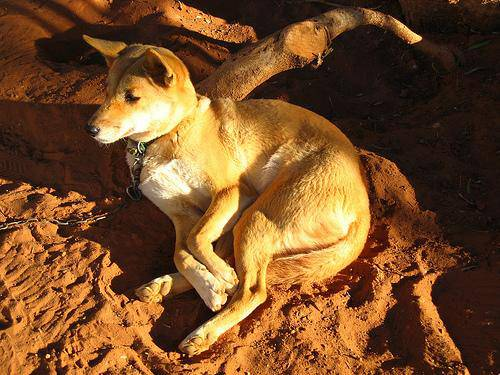

In [19]:
from IPython.display import Image
Image("/content/drive/MyDrive/Dog_Vision_Dataset/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

In [20]:
filenames =["drive/MyDrive/Dog_Vision_Dataset/train/" + fname + ".jpg" for fname in labels['id']]
filenames[:10]

['drive/MyDrive/Dog_Vision_Dataset/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog_Vision_Dataset/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog_Vision_Dataset/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog_Vision_Dataset/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog_Vision_Dataset/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog_Vision_Dataset/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog_Vision_Dataset/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog_Vision_Dataset/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog_Vision_Dataset/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog_Vision_Dataset/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [21]:
import os
if len(os.listdir("/content/drive/MyDrive/Dog_Vision_Dataset/train"))==len(filenames):
  print("Number of files match")
else:
  print("Incorrect number of files")

Number of files match


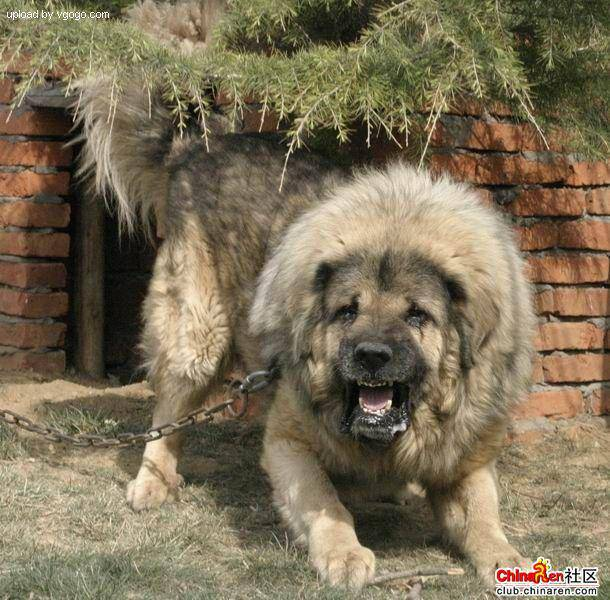

In [22]:
Image(filenames[9000])

In [23]:
label = labels['breed'].to_numpy()
label

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [24]:
len(label)

10222

In [25]:
unique_breeds = np.unique(label)
unique_breeds, len(unique_breeds)

(array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
        'american_staffordshire_terrier', 'appenzeller',
        'australian_terrier', 'basenji', 'basset', 'beagle',
        'bedlington_terrier', 'bernese_mountain_dog',
        'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
        'bluetick', 'border_collie', 'border_terrier', 'borzoi',
        'boston_bull', 'bouvier_des_flandres', 'boxer',
        'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
        'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
        'chow', 'clumber', 'cocker_spaniel', 'collie',
        'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
        'doberman', 'english_foxhound', 'english_setter',
        'english_springer', 'entlebucher', 'eskimo_dog',
        'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
        'german_short-haired_pointer', 'giant_schnauzer',
        'golden_retriever', 'gordon_setter', 'gre

In [26]:
boolean_labels = [labell == unique_breeds for labell in label]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [27]:
len(boolean_labels)

10222

In [28]:
#Creating your own validation set
#Set up X and Y variables
x = filenames
y = boolean_labels


In [29]:
#set number of images for experimentation
NUM_IMAGES = 1000 #@param{type:"slider", min:1000, max:10000, step:1000}

In [30]:
#splitting data
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2, random_state=42)
len(x_train), len(x_test), len(y_train), len(y_test)

(800, 200, 800, 200)

array([[[ 54,  42,  42],
        [ 50,  38,  38],
        [ 49,  37,  37],
        ...,
        [ 95,  85,  83],
        [ 95,  85,  83],
        [ 95,  85,  83]],

       [[ 64,  52,  52],
        [ 61,  49,  49],
        [ 61,  49,  49],
        ...,
        [ 96,  86,  84],
        [ 97,  86,  84],
        [ 96,  86,  84]],

       [[ 67,  55,  55],
        [ 66,  54,  54],
        [ 69,  57,  57],
        ...,
        [ 99,  88,  86],
        [101,  87,  86],
        [ 99,  88,  86]],

       ...,

       [[ 66,  52,  39],
        [ 95,  81,  68],
        [ 33,  16,   6],
        ...,
        [ 32,  21,  17],
        [ 31,  20,  16],
        [ 31,  20,  16]],

       [[111,  97,  84],
        [116, 102,  89],
        [ 83,  66,  56],
        ...,
        [ 31,  20,  16],
        [ 31,  20,  16],
        [ 32,  21,  17]],

       [[112,  98,  85],
        [106,  92,  79],
        [167, 150, 140],
        ...,
        [ 30,  19,  15],
        [ 31,  20,  16],
        [ 32,  21,  17]]], dtype=uint8)
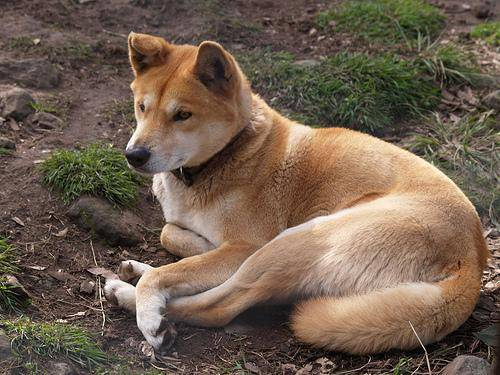

In [31]:
#Using matplotlib.pyplot to read images
image = plt.imread(filenames[4000])
image

In [32]:

#turning the image into a tensor object
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 500, 3), dtype=uint8, numpy=
array([[[54, 42, 42],
        [50, 38, 38],
        [49, 37, 37],
        ...,
        [95, 85, 83],
        [95, 85, 83],
        [95, 85, 83]],

       [[64, 52, 52],
        [61, 49, 49],
        [61, 49, 49],
        ...,
        [96, 86, 84],
        [97, 86, 84],
        [96, 86, 84]]], dtype=uint8)>

In [33]:
#define size of image
img_size = 224

#function to preprocess images
def preprocess(image_path):
  #read in an image from path
  image = tf.io.read_file(image_path)

  #turn the jpg image into tensor using RGB channels
  image = tf.image.decode_jpeg(image, channels=3)

  #convert the image channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)

  #resize the image into (244,244)
  image = tf.image.resize(image, size=[img_size, img_size])

  return image

In [34]:
#trying out the above code for myself
tensor = tf.io.read_file(filenames[42])
tensor = tf.image.decode_jpeg(tensor, channels=3)
tensor = tf.image.convert_image_dtype(tensor, tf.float32)
tensor

<tf.Tensor: shape=(257, 350, 3), dtype=float32, numpy=
array([[[0.34509805, 0.5411765 , 0.34117648],
        [0.29411766, 0.4901961 , 0.2901961 ],
        [0.24705884, 0.43529415, 0.23137257],
        ...,
        [0.29803923, 0.5254902 , 0.32941177],
        [0.29803923, 0.5254902 , 0.3372549 ],
        [0.29411766, 0.52156866, 0.33333334]],

       [[0.2784314 , 0.47058827, 0.28627452],
        [0.25490198, 0.45098042, 0.25882354],
        [0.24313727, 0.43921572, 0.24705884],
        ...,
        [0.28627452, 0.5137255 , 0.3254902 ],
        [0.2901961 , 0.5176471 , 0.32941177],
        [0.2901961 , 0.5176471 , 0.32941177]],

       [[0.21176472, 0.41176474, 0.2509804 ],
        [0.21960786, 0.41960788, 0.25882354],
        [0.24313727, 0.4431373 , 0.28235295],
        ...,
        [0.27450982, 0.49803925, 0.32156864],
        [0.2784314 , 0.5019608 , 0.3254902 ],
        [0.28235295, 0.5058824 , 0.32941177]],

       ...,

       [[0.00784314, 0.04313726, 0.03921569],
        [0.01

## Why turn our data into batches?

lets say you're trying to find patterns in 10,000+ images at once.... they might not all fit into memory as the GPU is not strong enough to process all of them at once and still be reliable enough

Thus we are dividing our data into batches of 32 images.

In order to use tensorflow effectively, we need our data in the form of tensor tuples which look like this
`(image, label)`

In [35]:
#Return a tuple of tensors
def get_image_label(image_path, label):
  image = preprocess(image_path)
  return image, label

In [36]:
preprocess(x[42]), tf.constant(y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [37]:
BATCH_SIZE=32

def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  # since test data needs no change
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x)))
    data_batch = data.map(preprocess).batch(batch_size)
    return data_batch

  # if the data is a valid dataset, then you don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y)))
    data_batch = data.map(get_image_label).batch(batch_size)
    return data_batch

  else:
    print("Creating training data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y)))
    data = data.shuffle(buffer_size=len(x))
    # Create (image,label) tuples
    data_batch = data.map(get_image_label).batch(batch_size)
    return data_batch


In [38]:
train_data = create_data_batches(x_train,y_train)
valid_data = create_data_batches(x_test, y_test, valid_data=True)


Creating training data batches...
Creating validation data batches...


In [39]:
# Check different attributes of our tensor data
train_data.element_spec, valid_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [40]:
# creating a function to show 25 images from a batch
def show_25_images(images, labels):
  plt.figure(figsize=(10,10))
  for i in range(25):
    ax = plt.subplot(5,5,i+1)
    plt.imshow(images[i])
    plt.axis("off")
    plt.title(unique_breeds[labels[i].argmax()])  # argmax() returns the index of the maximum value

In [41]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images.shape, train_labels.shape

((32, 224, 224, 3), (32, 120))

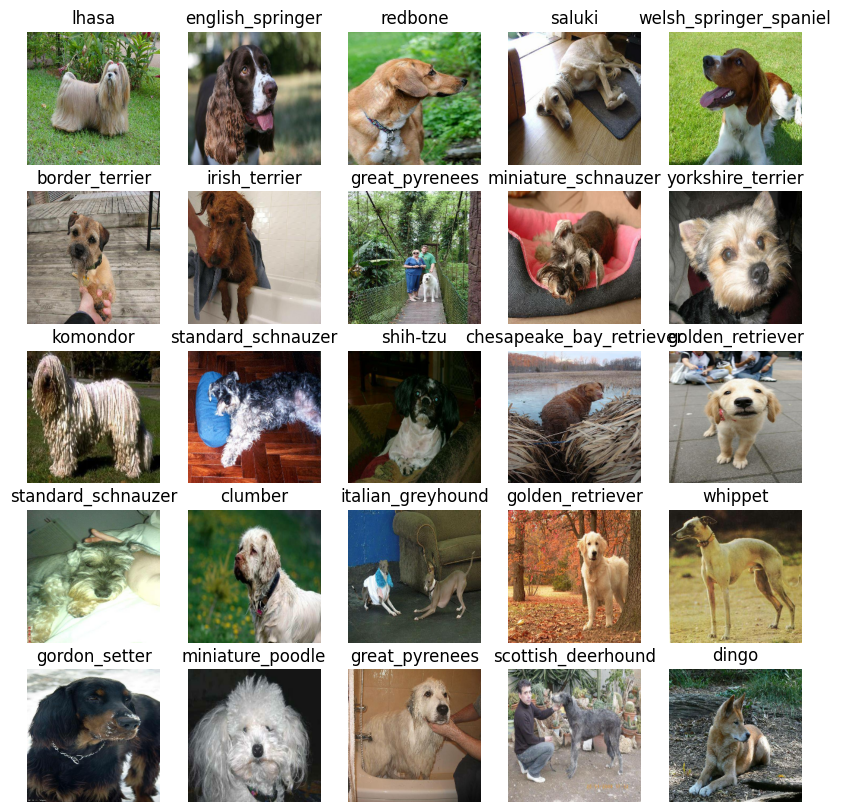

In [42]:
show_25_images(train_images, train_labels)

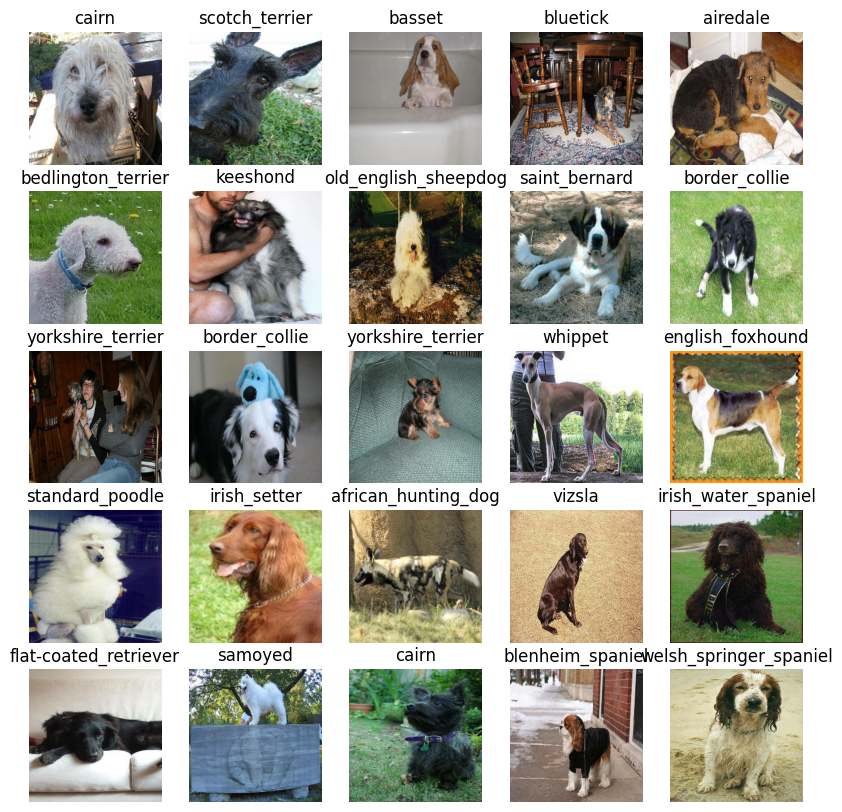

In [43]:
# To visualize validation set
val_images, val_labels = next(valid_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

In [44]:
# Setup input shape to the model
INPUT_SHAPE = [None ,img_size, img_size, 3] #  height, width, colour channels

# Setup output shape of the model
OUTPUT_SHAPE = len(unique_breeds) # number of unique labels

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1"

## Model Creation
use websites like:
* TensorFlow Hub
* Pytorch Hub
* Model Zoo
* Papers with Code

Now we will be building the model in layers.
* Take input_shape, output_shape and model as parameters.
* Define the model in layers.
* Compile the model (it should be evaluated and improved)
* Build the model (tell the model the input shape it'll be getting)
* Returns the model

In [ ]:
import tf_keras as tfk
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tfk.Sequential([
    hub.KerasLayer(MODEL_URL, input_shape=input_shape[1:]), # Layer 1 (input layer)
    tfk.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tfk.losses.CategoricalCrossentropy(), # Our model wants to reduce this (how wrong its guesses are)
      optimizer=tfk.optimizers.Adam(), # A friend telling our model how to improve its guesses
      metrics=["accuracy"] # We'd like this to go up
  )

  # Build the model
  model.build(INPUT_SHAPE) # Let the model know what kind of inputs it'll be getting

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1
Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 module_wrapper_10 (ModuleW  (None, 1001)              5432713   
 rapper)                                                         
                                                                 
 dense_8 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [ ]:
# Creating Tensorboard Callback
%load_ext tensorboard


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
import datetime
def create_tensorboard_callback(): # monitors performance of the model
  # create a log directory for storing our tensorflow callbacks.
  logdir = os.path.join("drive/MyDrive/Dog_Vision_Dataset/logs",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience = 3)

In [ ]:
# First training only on 1000 images to check functionality!
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
def train_model():
  # Create the model
  model = create_model()

  # Create new TensorBoard session everytime a model is trained
  tensorboard = create_tensorboard_callback()

  # Fit the model with the data
  model.fit(x=train_data,
            epochs = NUM_EPOCHS,
            validation_data=valid_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  return model

In [ ]:
model = train_model()

Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1


Layer ModuleWrapper was created by passing
non-serializable argument values in `__init__()`,
and therefore the layer must override `get_config()` in
order to be serializable. Please implement `get_config()`.

Example:

class CustomLayer(keras.layers.Layer):
    def __init__(self, arg1, arg2, **kwargs):
        super().__init__(**kwargs)
        self.arg1 = arg1
        self.arg2 = arg2

    def get_config(self):
        config = super().get_config()
        config.update({
            "arg1": self.arg1,
            "arg2": self.arg2,
        })
        return config


Epoch 1/100
25/25 [==============================] - 10s 217ms/step - loss: 4.6343 - accuracy: 0.0925 - val_loss: 3.5287 - val_accuracy: 0.2300
Epoch 2/100
25/25 [==============================] - 4s 167ms/step - loss: 1.6470 - accuracy: 0.7000 - val_loss: 2.2003 - val_accuracy: 0.5000
Epoch 3/100
25/25 [==============================] - 4s 163ms/step - loss: 0.5620 - accuracy: 0.9362 - val_loss: 1.7095 - val_accuracy: 0.6050
Epoch 4/100
25/25 [==============================] - 5s 188ms/step - loss: 0.2521 - accuracy: 0.9850 - val_loss: 1.5316 - val_accuracy: 0.6200
Epoch 5/100
25/25 [==============================] - 4s 162ms/step - loss: 0.1450 - accuracy: 0.9987 - val_loss: 1.4439 - val_accuracy: 0.6450
Epoch 6/100
25/25 [==============================] - 4s 167ms/step - loss: 0.1000 - accuracy: 1.0000 - val_loss: 1.3990 - val_accuracy: 0.6600
Epoch 7/100
25/25 [==============================] - 4s 166ms/step - loss: 0.0750 - accuracy: 1.0000 - val_loss: 1.3762 - val_accuracy: 0.665

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog_Vision_Dataset/logs

Reusing TensorBoard on port 6006 (pid 5507), started 0:16:08 ago. (Use '!kill 5507' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
predictions = model.predict(valid_data, verbose=1)
predictions

7/7 [==============================] - 13s 113ms/step


array([[5.0373969e-04, 9.5340493e-04, 1.8826278e-03, ..., 2.2698476e-04,
        1.3615896e-05, 7.8838281e-03],
       [1.5799999e-03, 8.8617060e-04, 2.0469626e-02, ..., 3.4347925e-04,
        1.2813105e-03, 7.7016331e-04],
       [2.3503571e-05, 3.7493877e-04, 4.7489407e-06, ..., 8.8574784e-04,
        1.0584966e-04, 3.5116768e-03],
       ...,
       [2.7375730e-05, 2.8019823e-04, 1.7798538e-04, ..., 8.5821805e-05,
        2.4153758e-04, 1.3751964e-04],
       [9.7737927e-03, 7.7870244e-04, 7.0572220e-04, ..., 2.7647524e-04,
        3.7232699e-04, 1.1029306e-02],
       [4.1859093e-04, 3.4567940e-05, 4.2734407e-03, ..., 1.0664688e-03,
        5.8333989e-04, 1.6706012e-04]], dtype=float32)

In [ ]:
index = 0
print(f"The maximum probability is: {np.max(predictions[index])}")
print(f"The sum is: {np.sum(predictions[index])}")
print(f"The max index is: {np.argmax(predictions[index])}")
print(f"The breed is: {unique_breeds[np.argmax(predictions[index])]}")

The maximum probability is: 0.17651160061359406
The sum is: 1.0
The max index is: 59
The breed is: irish_wolfhound


In [63]:
# Turning probabilities into a single lable
def get_pred_label(prediction_probabilities):
  return unique_breeds[np.argmax(prediction_probabilities)]


In [ ]:
valid_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
images_ = []
labels_ = []

for image, label in valid_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0], labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(labels_[0])

'cairn'

In [ ]:
get_pred_label(predictions[0])

'irish_wolfhound'

In [ ]:
# To functionise the above process
def unbatchify(data):
  images_ = []
  labels_ = []
  for image, label in data.unbatch().as_numpy_iterator():
    images_.append(image)
    labels_.append(unique_breeds[np.argmax(label)])
  return images_, labels_

val_images, val_labels = unbatchify(valid_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
def plot_predict(prediction_probabilities, labels, images, n=0):
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  pred_label = get_pred_label(pred_prob)
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  if pred_label== true_label:
    color='green'
  else:
    color='red'

  plt.title(f"Prediction: {pred_label},\n Actual: {true_label}, \n Prob: {(np.max(pred_prob)*100):.2f}", color=color)

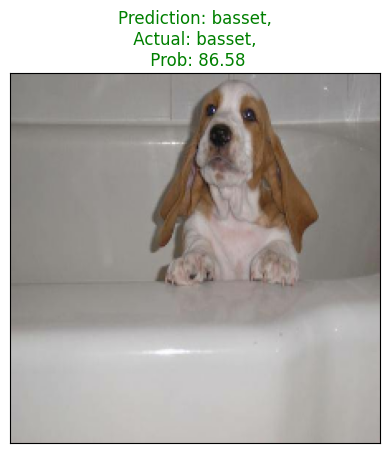

In [ ]:
plot_predict(predictions, val_labels, val_images, n=2)

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=0):
  pred_prob, true_label = prediction_probabilities[n], labels[n]
  pred_label = get_pred_label(pred_prob)

  top_10_pred_conf = np.argsort(pred_prob)[-10:][::-1]

  top_10_pred_values = pred_prob[top_10_pred_conf]
  top_10_pred_labels = unique_breeds[top_10_pred_conf]

  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values, color='grey')
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels, rotation='vertical')
  plt.yticks([])

  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color('green')
  else:
    pass

  plt.title(f"Actual: {true_label},\n Predicted: {pred_label}")

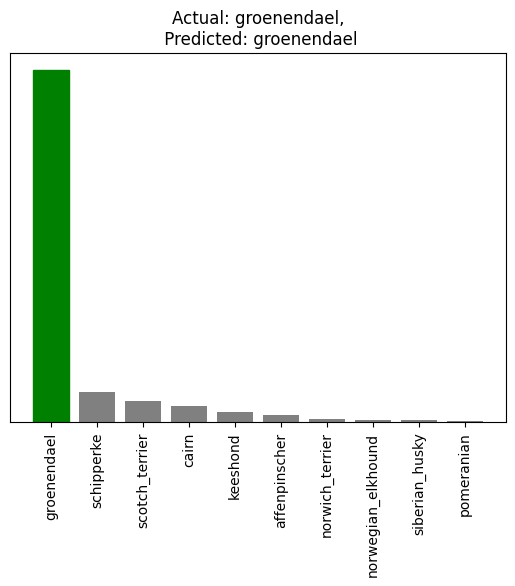

In [ ]:
plot_pred_conf(predictions, val_labels, n=77)

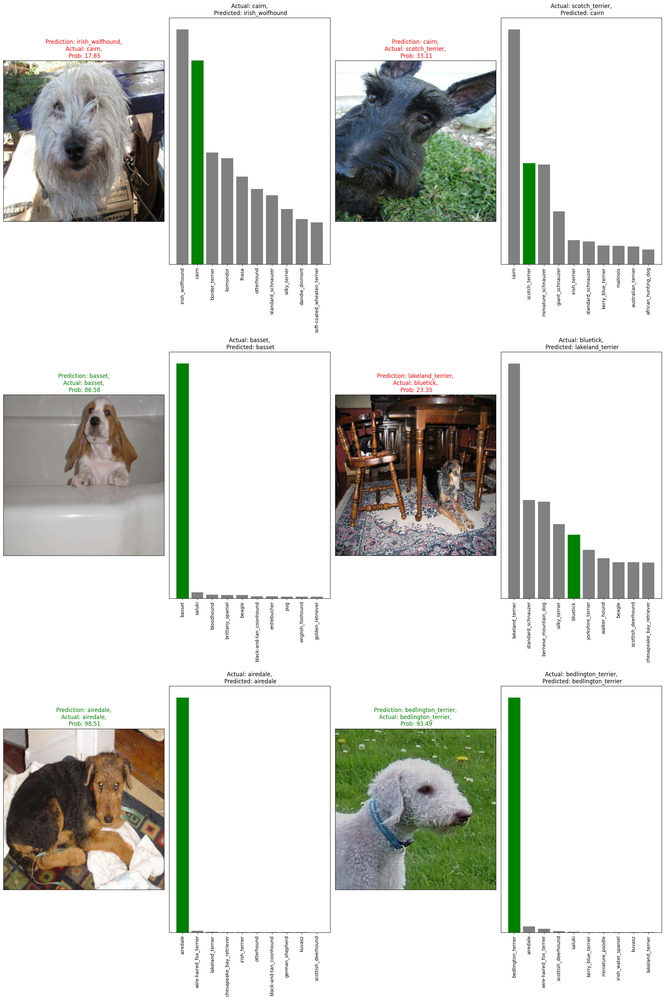

In [ ]:
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10*num_cols,10*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_predict(predictions, val_labels, val_images, i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(predictions, val_labels, i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [ ]:
def save_model(model, suffix=None):
  # Create a model directory
  modeldir = os.path.join("drive/MyDrive/Dog_Vision_Dataset/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path = modeldir + "-" + suffix + ".keras"
  print(f"Saving model to: {model_path}")
  model.save(model_path)

In [ ]:
def load_model(model_path):
  print(f"Loading saved model from: {model_path}")
  model = tfk.models.load_model(model_path,
                                      custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
model.save_weights('drive/MyDrive/Dog_Vision_Dataset/models/mobilenetv2_weights.h5')


In [45]:
def rebuild_model(model_path,input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE):
    # Recreate the same architecture
    model = tf.keras.Sequential([
        hub.KerasLayer(MODEL_URL, input_shape=input_shape[1:], trainable=True),
        tf.keras.layers.Dense(units=output_shape, activation="softmax")
    ])

    # Load the saved weights
    model.load_weights(model_path)

    # Compile the model (necessary for evaluation and training)
    model.compile(
        loss='categorical_crossentropy',  # or use your specific loss function
        optimizer='adam',  # or the optimizer you used
        metrics=['accuracy']
    )

    return model

In [ ]:
loaded_model = rebuild_model()

TypeError: rebuild_model() missing 1 required positional argument: 'model_path'

In [ ]:
model.evaluate(valid_data)

7/7 [==============================] - 1s 98ms/step - loss: 1.2996 - accuracy: 0.6850


[1.299588918685913, 0.6850000023841858]

In [ ]:
loaded_model.evaluate(valid_data)

7/7 [==============================] - 1s 100ms/step - loss: 1.4258 - accuracy: 0.6850


[1.425849437713623, 0.6850000023841858]

In [ ]:
len(x), len(y)

(10222, 10222)

In [ ]:
full_data = create_data_batches(x, y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
full_model = create_model()

Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1


In [ ]:
full_model_tensorboard = create_tensorboard_callback()

full_model_Early_Stopping = tfk.callbacks.EarlyStopping(monitor='accuracy', patience=3)

In [ ]:
#fit the model with the full data
full_model.fit(x=full_data, epochs=NUM_EPOCHS, callbacks=[full_model_tensorboard, full_model_Early_Stopping])

Layer ModuleWrapper was created by passing
non-serializable argument values in `__init__()`,
and therefore the layer must override `get_config()` in
order to be serializable. Please implement `get_config()`.

Example:

class CustomLayer(keras.layers.Layer):
    def __init__(self, arg1, arg2, **kwargs):
        super().__init__(**kwargs)
        self.arg1 = arg1
        self.arg2 = arg2

    def get_config(self):
        config = super().get_config()
        config.update({
            "arg1": self.arg1,
            "arg2": self.arg2,
        })
        return config


Epoch 1/100
320/320 [==============================] - 832s 3s/step - loss: 1.3319 - accuracy: 0.6711
Epoch 2/100
320/320 [==============================] - 55s 173ms/step - loss: 0.4025 - accuracy: 0.8838
Epoch 3/100
320/320 [==============================] - 56s 174ms/step - loss: 0.2383 - accuracy: 0.9319
Epoch 4/100
320/320 [==============================] - 51s 159ms/step - loss: 0.1528 - accuracy: 0.9645
Epoch 5/100
320/320 [==============================] - 66s 206ms/step - loss: 0.1069 - accuracy: 0.9796
Epoch 6/100
320/320 [==============================] - 55s 171ms/step - loss: 0.0745 - accuracy: 0.9882
Epoch 7/100
320/320 [==============================] - 56s 174ms/step - loss: 0.0575 - accuracy: 0.9915
Epoch 8/100
320/320 [==============================] - 51s 159ms/step - loss: 0.0467 - accuracy: 0.9944
Epoch 9/100
320/320 [==============================] - 51s 159ms/step - loss: 0.0381 - accuracy: 0.9959
Epoch 10/100
320/320 [==============================] - 55s 172ms/

In [ ]:
full_model.save_weights('drive/MyDrive/Dog_Vision_Dataset/models/mobilenetv2_weights.h5')

In [46]:
loaded_full_model = rebuild_model('drive/MyDrive/Dog_Vision_Dataset/models/mobilenetv2_weights.h5')

In [47]:
test_path = 'drive/MyDrive/Dog_Vision_Dataset/test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog_Vision_Dataset/test/e2888231cedd08540816e629c0733922.jpg',
 'drive/MyDrive/Dog_Vision_Dataset/test/e5fa615e36dc3b2b3f554aa5097a6ece.jpg',
 'drive/MyDrive/Dog_Vision_Dataset/test/e00e5f7f822fd670bba314f87cce8428.jpg',
 'drive/MyDrive/Dog_Vision_Dataset/test/e4ba350279796ff15c3a634037a6f88e.jpg',
 'drive/MyDrive/Dog_Vision_Dataset/test/e12168553b1e0b5e56d5ab6ac8a58984.jpg',
 'drive/MyDrive/Dog_Vision_Dataset/test/e14cc46044a0fb31554250b07c93bd48.jpg',
 'drive/MyDrive/Dog_Vision_Dataset/test/e0ccfbe350e0e8bc7bb7e1f95fa07b3b.jpg',
 'drive/MyDrive/Dog_Vision_Dataset/test/de59703200e1b19b520033e76dea9b62.jpg',
 'drive/MyDrive/Dog_Vision_Dataset/test/e16c4485a37ac90e1623e2da77513648.jpg',
 'drive/MyDrive/Dog_Vision_Dataset/test/e2686707ac5b5f75ce2ccbc906b624d8.jpg']

In [48]:
len(test_filenames)

10357

In [49]:
test_Data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [50]:
test_Data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [51]:
#making predictions on full test data will take some time
test_predictions = loaded_full_model.predict(test_Data, verbose=1)

324/324 [==============================] - 368s 1s/step


In [52]:
np.savetxt("drive/MyDrive/Dog_Vision_Dataset/preds_Array.csv", test_predictions, delimiter=',')

In [53]:
test_predictions = np.loadtxt("drive/MyDrive/Dog_Vision_Dataset/preds_Array.csv", delimiter=',')

In [54]:
preds_df = pd.DataFrame(columns=['id'] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [55]:
test_ids = [os.path.splitext(path) for path in os.listdir(test_path)]
preds_df['id']=test_ids
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,"(e2888231cedd08540816e629c0733922, .jpg)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,"(e5fa615e36dc3b2b3f554aa5097a6ece, .jpg)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,"(e00e5f7f822fd670bba314f87cce8428, .jpg)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,"(e4ba350279796ff15c3a634037a6f88e, .jpg)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,"(e12168553b1e0b5e56d5ab6ac8a58984, .jpg)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [56]:
preds_df[list(unique_breeds)]=test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,"(e2888231cedd08540816e629c0733922, .jpg)",7.235400e-09,8.804872e-07,4.083010e-09,8.788142e-06,9.775110e-07,1.399371e-06,2.584310e-06,9.653554e-07,9.218000e-01,...,1.550700e-07,1.520752e-06,1.248987e-05,3.563493e-02,4.816627e-07,8.523645e-07,2.422379e-07,6.655863e-07,1.427036e-04,1.505299e-09
1,"(e5fa615e36dc3b2b3f554aa5097a6ece, .jpg)",4.043116e-09,4.421526e-10,8.774584e-08,4.862836e-10,3.361909e-06,2.176427e-09,6.207085e-07,3.974431e-04,1.394080e-05,...,6.525178e-04,1.081119e-05,1.692487e-08,2.128604e-11,4.681504e-07,4.042284e-07,5.529978e-08,2.405662e-07,7.416078e-08,2.354200e-06
2,"(e00e5f7f822fd670bba314f87cce8428, .jpg)",5.135479e-10,2.502785e-10,2.426524e-09,1.490209e-06,8.007263e-10,1.576197e-07,4.525154e-09,4.541131e-10,3.337908e-08,...,1.421323e-09,8.356883e-09,1.290774e-08,7.222454e-08,2.682581e-08,1.283805e-10,3.776521e-08,7.648636e-09,5.741008e-10,2.460285e-08
3,"(e4ba350279796ff15c3a634037a6f88e, .jpg)",2.255489e-06,3.154124e-05,9.635998e-04,1.182718e-08,4.233605e-10,5.540729e-09,3.586450e-09,5.030444e-11,2.791933e-12,...,3.613717e-07,4.281172e-11,5.876608e-08,1.455926e-07,6.388261e-09,3.282907e-08,2.195712e-10,1.422563e-05,6.470554e-10,6.344764e-09
4,"(e12168553b1e0b5e56d5ab6ac8a58984, .jpg)",2.428583e-09,1.108605e-10,2.731898e-10,6.487907e-08,1.311613e-05,6.206668e-09,1.961140e-10,8.112777e-10,4.884037e-08,...,3.161553e-06,4.723201e-08,9.789739e-05,1.817478e-07,1.792807e-04,5.354063e-10,4.446052e-11,1.389220e-10,2.209769e-06,1.372216e-06


In [57]:
preds_df.to_csv("drive/MyDrive/Dog_Vision_Dataset/full_model_predictions.csv", index=False)


In [58]:
custom_path = 'drive/MyDrive/Dog_Vision_Dataset/custom_photos/'
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]
custom_image_paths

['drive/MyDrive/Dog_Vision_Dataset/custom_photos/dog2.jpg',
 'drive/MyDrive/Dog_Vision_Dataset/custom_photos/dog3.jpg']

In [59]:
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [61]:
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 2s 2s/step


In [64]:
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['chow', 'pomeranian']

In [65]:
custom_images = []
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)


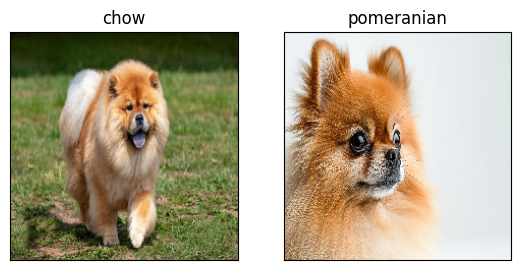

In [66]:
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)

# New Section